In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

ganesh12345m_masks1_path = kagglehub.dataset_download('ganesh12345m/masks1')
adityakudupudi_inpainting_checkpoints_path = kagglehub.dataset_download('adityakudupudi/inpainting-checkpoints')
adityakudupudi_paintings_path = kagglehub.dataset_download('adityakudupudi/paintings')

print('Data source import complete.')


# Code Contribution

**Ganesh**  *(AI22BTECH11017)*
  - Mask preparation
  - Dataset Preparation
  - Downscale  and upscale Block
  - Loss function
  - checkpoints
  - Outputs


**Aditya**   *(AI22BTECH11013)*
  *  Spectral Transform
  *  Fast Fourier Convolutions
  * Inpainting Network
  * FID and Inception scores
  * Training Loop
  * Outputs


# MASK GENERATION

In [ ]:
import numpy as np
import cv2
import os
import random

def save_mask(mask, path):
    cv2.imwrite(path, (mask * 255).astype(np.uint8))

def generate_narrowed_mask(size=256):
    mask = np.zeros((size, size), dtype=np.uint8)
    num_lines = random.randint(1, 3)
    for _ in range(num_lines):
        orientation = random.choice(['vertical', 'horizontal'])
        if orientation == 'vertical':
            w = random.randint(5, 15)
            h = size
            x = random.randint(0, size - w)
            cv2.rectangle(mask, (x, 0), (x + w, h), 1, -1)
        else:
            h = random.randint(5, 15)
            w = size
            y = random.randint(0, size - h)
            cv2.rectangle(mask, (0, y), (w, y + h), 1, -1)
    return mask

def generate_large_mask(size=256, mode='wide', p=0.5):
    mask = np.zeros((size, size), dtype=np.uint8)
    if mode == 'wide':
        w = int(size * p)
        x = random.randint(0, size - w)
        cv2.rectangle(mask, (x, 0), (x + w, size), 1, -1)
    elif mode == 'box':
        box_w = int(size * p)
        box_h = int(size * p)
        x = random.randint(0, size - box_w)
        y = random.randint(0, size - box_h)
        cv2.rectangle(mask, (x, y), (x + box_w, y + box_h), 1, -1)
    return mask

def generate_deepfillv2_mask(size=256):
    mask = np.zeros((size, size), dtype=np.uint8)
    num_shapes = random.randint(4, 8)
    for _ in range(num_shapes):
        shape_type = random.choice(['rect', 'circle', 'line'])
        if shape_type == 'rect':
            x1, y1 = random.randint(0, size-1), random.randint(0, size-1)
            x2, y2 = random.randint(x1, size-1), random.randint(y1, size-1)
            cv2.rectangle(mask, (x1, y1), (x2, y2), 1, -1)
        elif shape_type == 'circle':
            x, y = random.randint(0, size-1), random.randint(0, size-1)
            r = random.randint(10, size // 4)
            cv2.circle(mask, (x, y), r, 1, -1)
        elif shape_type == 'line':
            x1, y1 = random.randint(0, size-1), random.randint(0, size-1)
            x2, y2 = random.randint(0, size-1), random.randint(0, size-1)
            thickness = random.randint(5, 15)
            cv2.line(mask, (x1, y1), (x2, y2), 1, thickness)
    return mask

def generate_all_masks(output_dir="generated_masks", size=256, count=20):
    os.makedirs(output_dir, exist_ok=True)
    types = {
        "narrowed": generate_narrowed_mask,
        "ours_wide": lambda: generate_large_mask(size, 'wide', p=0.5),
        "ours_box": lambda: generate_large_mask(size, 'box', p=0.5),
        "deepfillv2": generate_deepfillv2_mask
    }

    for mask_type, generator in types.items():
        type_dir = os.path.join(output_dir, mask_type)
        os.makedirs(type_dir, exist_ok=True)
        for i in range(count):
            mask = generator()
            save_mask(mask, os.path.join(type_dir, f"{mask_type}_{i:02d}.jpg"))

# Run the generator
generate_all_masks()

# DATASET PREPARATION

In [ ]:
import os
import random
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision import transforms

class MaskedInpaintingDataset(Dataset):
    def __init__(self, image_dir, mask_root_dir, specific_folder = False , image_size=(256, 256)):
        self.image_paths = [os.path.join(image_dir, img) for img in os.listdir(image_dir)]
        self.mask_paths = []
        if specific_folder:
            for file in os.listdir(mask_root_dir):
                if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                    self.mask_paths.append(os.path.join(mask_root_dir, file))
        else:
            for root, _, files in os.walk(mask_root_dir):
                for file in files:
                    if file.endswith(('.png', '.jpg', '.jpeg')):
                        self.mask_paths.append(os.path.join(root, file))

        self.transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        mask_path = random.choice(self.mask_paths)
        mask = Image.open(mask_path).convert('L')

        image = self.transform(image)
        mask = self.transform(mask)
        masked_image = image * (1 - mask)

        return masked_image, mask, image


In [ ]:
from torch.utils.data import DataLoader,ConcatDataset

dataset = MaskedInpaintingDataset('/kaggle/input/paintings/resized_dataset/resized_dataset', '/kaggle/input/masks1',specific_folder = False )



dataloader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=0)

In [ ]:
from torch.utils.data import DataLoader,ConcatDataset

dataset1 = MaskedInpaintingDataset('/kaggle/input/paintings/resized_dataset/resized_dataset', '/kaggle/input/masks1/Narrow',specific_folder = True )
dataset2 = MaskedInpaintingDataset('/kaggle/input/paintings/resized_dataset/resized_dataset', '/kaggle/input/masks1/DeepFillv2',specific_folder = True )

combined_dataset = ConcatDataset([dataset1, dataset2])

# Create a DataLoader from the combined dataset
dataloader = DataLoader(combined_dataset, batch_size=16, shuffle=True)

# dataloader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=0)


In [ ]:
dataset

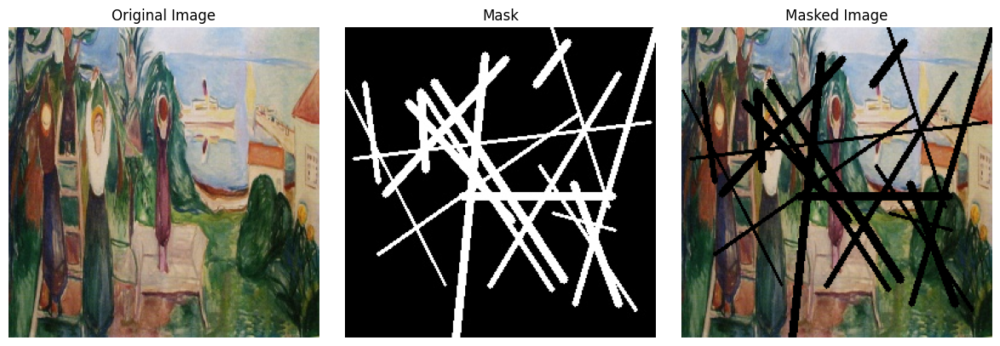

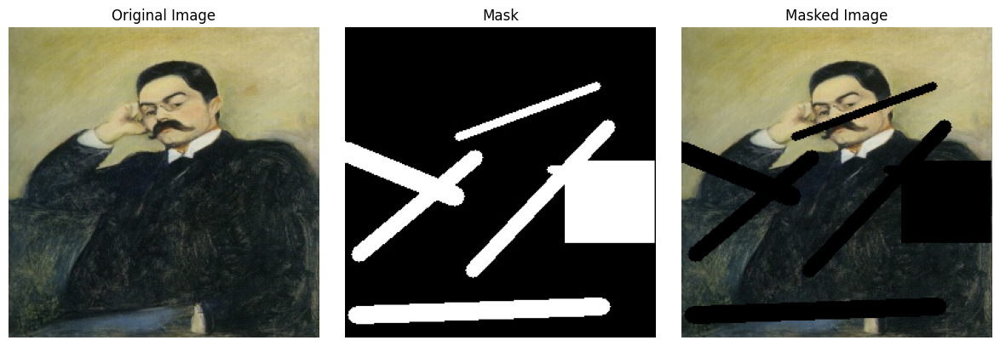

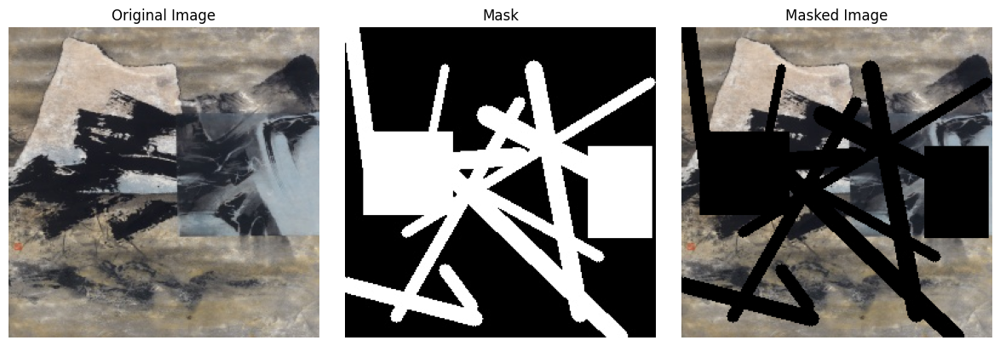

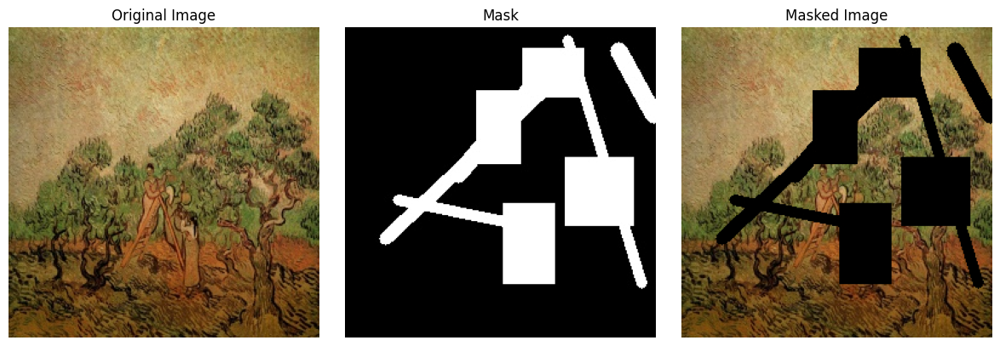

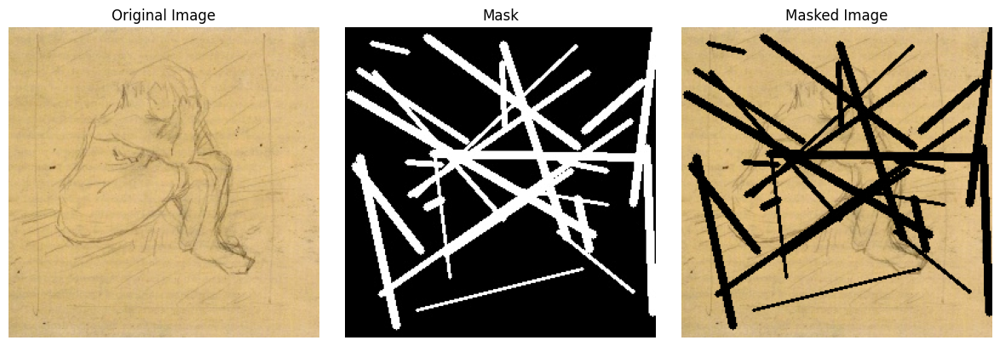

...

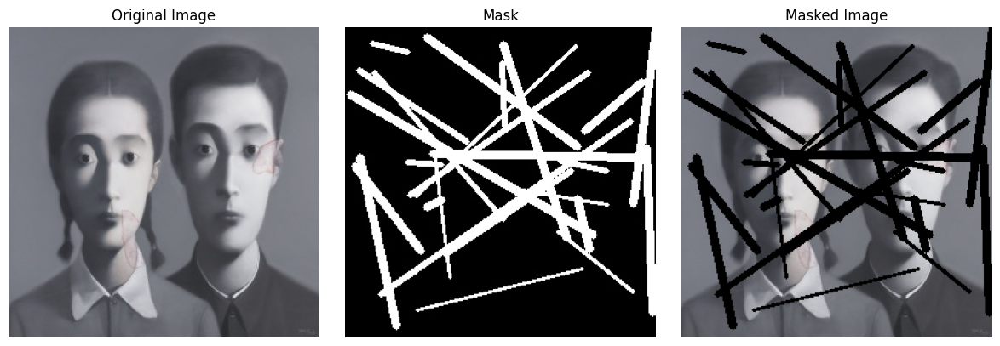

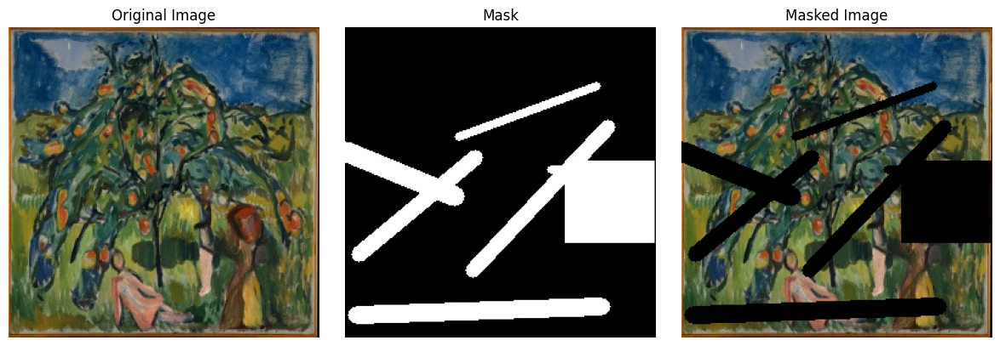

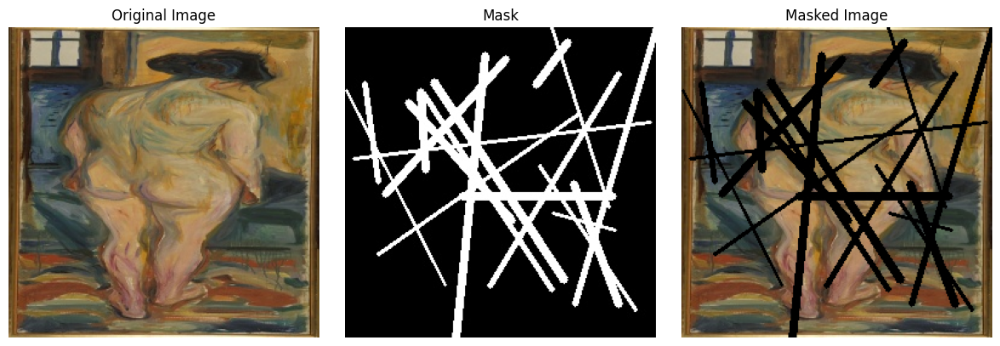

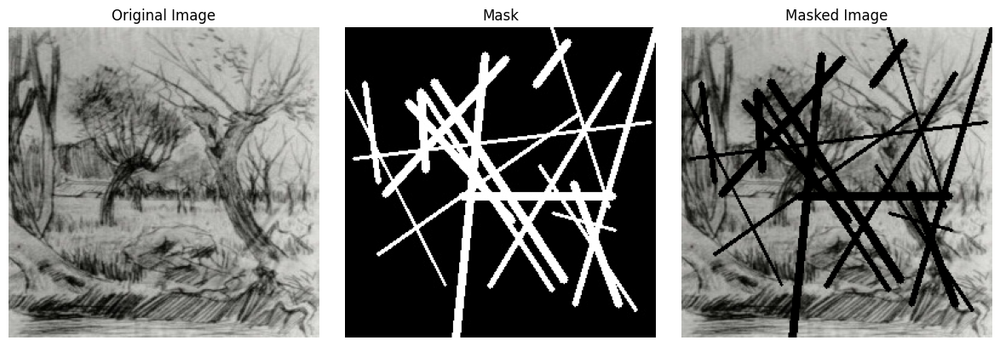

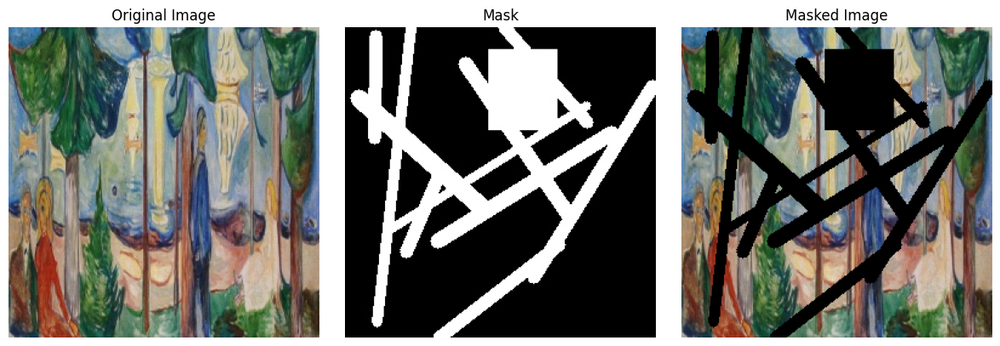

In [ ]:
import matplotlib.pyplot as plt
import torchvision

def visualize_inpainting_batch(dataloader, num_batches=1):
    G = iter(dataloader)
    for _ in range(num_batches):
        masked_imgs, masks, real_imgs = next(G)

        for i in range(len(masked_imgs)):
            fig, axs = plt.subplots(1, 3, figsize=(12, 4))
            axs[0].imshow(real_imgs[i].permute(1, 2, 0).cpu())
            axs[0].set_title("Original Image")
            axs[0].axis('off')

            axs[1].imshow(masks[i][0].cpu(), cmap='gray')
            axs[1].set_title("Mask")
            axs[1].axis('off')

            axs[2].imshow(masked_imgs[i].permute(1, 2, 0).cpu())
            axs[2].set_title("Masked Image")
            axs[2].axis('off')

            plt.tight_layout()
            plt.show()

# Call this to visualize your dataset
visualize_inpainting_batch(dataloader, num_batches=1)


# DOWNSCALE BLOCK

In [ ]:
import torch
import torch.nn as nn

class DownscaleBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.block(x)



In [ ]:
batch_size, in_ch, H, W = 2, 4, 128, 128
x = torch.randn(batch_size, in_ch, H, W)
seq = nn.Sequential(
    DownscaleBlock(in_ch, 8),   # 4→8, 128→64
    DownscaleBlock(8, 16),      # 8→16, 64→32
    DownscaleBlock(16, 32)      # 16→32, 32→16
)
y = seq(x)
print("Sequential blocks output shape correct:", y.shape)

Sequential blocks output shape correct: torch.Size([2, 32, 16, 16])


# UPSCALE BLOCK

In [ ]:
import torch
import torch.nn as nn

class UpscaleBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        """
        A single upsampling block:
          – Nearest‑neighbor Upsample ×2
          – 3×3 Conv, stride=1, padding=1
          – BatchNorm
          – ReLU
        """
        super().__init__()
        self.block = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.block(x)

In [ ]:
batch_size, in_ch, H, W = 2,32, 16, 16
x = torch.randn(batch_size, in_ch, H, W)
seq = nn.Sequential(
    UpscaleBlock(32, 16),   # 4→8, 128→64
    UpscaleBlock(16, 8),    # 8→16, 64→32
    UpscaleBlock(8, 4)      # 16→32, 32→16
)
y = seq(x)
print("Sequential blocks output shape correct:", y.shape)

Sequential blocks output shape correct: torch.Size([2, 4, 128, 128])


# SPECTRAL TRANSFORM

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SpectralTransform(nn.Module):
    def __init__(self, in_channels):
        super(SpectralTransform, self).__init__()
        self.conv_bn_relu = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, kernel_size=1),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True)
        )

        self.freq_conv = nn.Sequential(
            nn.Conv2d(2 * in_channels, 2 * in_channels, kernel_size=1),
            nn.BatchNorm2d(2 * in_channels),
            nn.ReLU(inplace=True)
        )

        self.final_conv1x1 = nn.Conv2d(in_channels, in_channels, kernel_size=1)

    def forward(self, x):
        B, C, H, W = x.shape
        assert W % 2 == 0, "Width must be even"

        # Step 1: Pre-conv before FFT
        x_spatial = self.conv_bn_relu(x)  # (B, C, H, W)

        # Step 2: Real FFT2D
        x_fft = torch.fft.rfft2(x_spatial, norm='ortho')  # (B, C, H, W//2 + 1), complex

        # Step 3: Complex to Real (split into 2C real channels)
        x_real = x_fft.real
        x_imag = x_fft.imag
        x_fft_split = torch.cat([x_real, x_imag], dim=1)  # (B, 2C, H, W//2 + 1)

        # Step 4: Conv in frequency domain
        x_fft_processed = self.freq_conv(x_fft_split)  # (B, 2C, H, W//2 + 1)

        # Step 5: Convert back to complex
        real, imag = x_fft_processed.chunk(2, dim=1)
        x_fft_complex = torch.complex(real, imag)  # (B, C, H, W//2 + 1)

        # Step 6: Inverse FFT
        x_irfft = torch.fft.irfft2(x_fft_complex, s=(H, W), norm='ortho')  # (B, C, H, W)

        # Step 7: Residual addition
        x_res = x_irfft + x_spatial  # (B, C, H, W)

        # Step 8: Final 1x1 conv
        out = self.final_conv1x1(x_res)

        return out


In [ ]:
 model = SpectralTransform(in_channels=32)

input_tensor = torch.randn(1, 32, 128, 128)  # (B, C, H, W)
output = model(input_tensor)

print(f"Input shape:  {input_tensor.shape}")
print(f"Output shape: {output.shape}")

Input shape:  torch.Size([1, 32, 128, 128])
Output shape: torch.Size([1, 32, 128, 128])


# FAST FOURIER CONVOLUTIONS

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1):
        super(ConvBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.block(x)


class SpectralTransform(nn.Module):
    def __init__(self, in_channels):
        super(SpectralTransform, self).__init__()
        self.conv_bn_relu = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, kernel_size=1),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True)
        )

        self.freq_conv = nn.Sequential(
            nn.Conv2d(2 * in_channels, 2 * in_channels, kernel_size=1),
            nn.BatchNorm2d(2 * in_channels),
            nn.ReLU(inplace=True)
        )

        self.final_conv1x1 = nn.Conv2d(in_channels, in_channels, kernel_size=1)

    def forward(self, x):
        B, C, H, W = x.shape
        assert W % 2 == 0, "Width must be divisible by 2"

        # Step 1: Pre-conv before FFT
        x_spatial = self.conv_bn_relu(x)

        # Step 2: Real FFT2D
        x_fft = torch.fft.rfft2(x_spatial, norm='ortho')

        # Step 3: Complex to real split
        x_real = x_fft.real
        x_imag = x_fft.imag
        x_fft_split = torch.cat([x_real, x_imag], dim=1)  # (B, 2C, H, W//2 + 1)

        # Step 4: Frequency domain conv
        x_fft_processed = self.freq_conv(x_fft_split)

        # Step 5: Real to complex
        real, imag = x_fft_processed.chunk(2, dim=1)
        x_fft_complex = torch.complex(real, imag)

        # Step 6: Inverse FFT
        x_irfft = torch.fft.irfft2(x_fft_complex, s=(H, W), norm='ortho')

        # Step 7: Residual + final conv
        x_res = x_irfft + x_spatial
        return self.final_conv1x1(x_res)


class FFC(nn.Module):
    def __init__(self, in_channels, out_channels, ratio_g=0.5):
        super(FFC, self).__init__()
        assert 0 <= ratio_g <= 1, "ratio_g must be between 0 and 1"

        self.in_c_local = int(in_channels * (1 - ratio_g))
        self.in_c_global = in_channels - self.in_c_local
        self.out_c_local = int(out_channels * (1 - ratio_g))
        self.out_c_global = out_channels - self.out_c_local

        # Local and global branches
        self.local_in = ConvBlock(self.in_c_local, self.out_c_local)
        self.global_in = ConvBlock(self.in_c_global, self.out_c_global)

        # Cross-path convs
        self.ll = nn.Conv2d(self.out_c_local, self.out_c_local, kernel_size=3, padding=1)
        self.lg = nn.Conv2d(self.out_c_local, self.out_c_global, kernel_size=3, padding=1)
        self.gl = nn.Conv2d(self.out_c_global, self.out_c_local, kernel_size=3, padding=1)

        self.gg_spectral = SpectralTransform(self.out_c_global)

        # BN-ReLU after residual joins
        self.local_bn_relu = nn.Sequential(
            nn.BatchNorm2d(self.out_c_local),
            nn.ReLU(inplace=True)
        )

        self.global_bn_relu = nn.Sequential(
            nn.BatchNorm2d(self.out_c_global),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x_l, x_g = torch.split(x, [self.in_c_local, self.in_c_global], dim=1)

        # Local and global inputs
        x_l = self.local_in(x_l)
        x_g = self.global_in(x_g)

        # Local pathway
        out_ll = self.ll(x_l)
        out_gl = self.gl(x_g)
        local_out = self.local_bn_relu(out_ll + out_gl)

        # Global pathway
        out_lg = self.lg(x_l)
        out_gg = self.gg_spectral(x_g)
        global_out = self.global_bn_relu(out_lg + out_gg)

        return torch.cat([local_out, global_out], dim=1)


In [ ]:
# Example input with 4 channels, divisible into 2 local and 2 global
ffc = FFC(in_channels=32, out_channels=32, ratio_g=0.5)
x = torch.randn(1, 32, 16, 16)
out = ffc(x)

print("Output shape:", out.shape)  # Expected: (1, 8, 64, 64)


Output shape: torch.Size([1, 32, 16, 16])


# INPAINTING NETWORK

In [ ]:
import torch
import torch.nn as nn

class InpaintingNetwork(nn.Module):
    def __init__(self, in_channels=4, base_channels=64, num_ffc_blocks=9):
        super(InpaintingNetwork, self).__init__()

        # Step 1: Downscale
        self.downscale = DownscaleBlock(in_channels, base_channels)  # 3x downsample

        # Step 2: Residual blocks of FFCs
        ffc_blocks = []
        for _ in range(num_ffc_blocks):
            ffc_blocks.append(
                FFC(base_channels, base_channels, ratio_g=0.5)
            )
        self.ffc_stack = nn.Sequential(*ffc_blocks)

        # Step 3: Upscale
        self.upscale = UpscaleBlock(base_channels, 3)  # 3x upsample to final RGB

    def forward(self, x):
        x = self.downscale(x)         # Downscale input
        x = self.ffc_stack(x)         # Pass through stacked FFC blocks
        x = self.upscale(x)           # Upscale to original resolution
        return x


In [ ]:
img = next(iter(dataloader))

In [ ]:
n = torch.concat((img[0],img[1]),dim = 1)

In [ ]:
n.shape

torch.Size([4, 4, 256, 256])

In [ ]:
img[1].shape

torch.Size([4, 1, 256, 256])

In [ ]:
img[2].shape

torch.Size([4, 3, 256, 256])

In [ ]:
# Create dummy 4-channel image (masked input + mask)
x = torch.randn(1, 4, 256, 256)

model = InpaintingNetwork()
out = model(n)

print(out.shape)


torch.Size([4, 3, 256, 256])


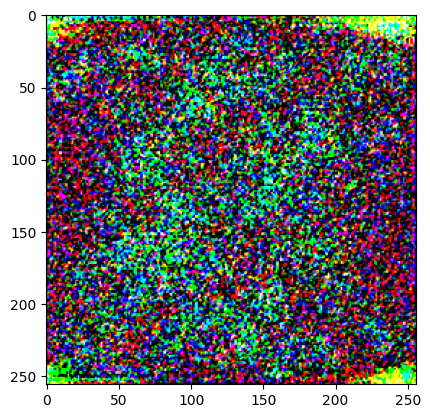

In [ ]:
plt.imshow(out[0].detach().permute(1, 2, 0).cpu())

# LOSS FUNCTION

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import vgg19
from torchvision.models.feature_extraction import create_feature_extractor


# ---------------------------------------------------------
# 1. Adversarial Loss (non-saturating) with PatchDiscriminator
# ---------------------------------------------------------
class AdvLoss(nn.Module):
    def __init__(self, discriminator):
        super().__init__()
        self.disc = discriminator

    def forward(self, real_imgs, fake_imgs):
        real_pred = torch.clamp(self.disc(real_imgs), 1e-6, 1 - 1e-6)
        fake_pred = torch.clamp(self.disc(fake_imgs.detach()), 1e-6, 1 - 1e-6)
        D_loss = -torch.mean(torch.log(real_pred)) - torch.mean(torch.log(1 - fake_pred))
        G_loss = -torch.mean(torch.log(fake_pred))
        return D_loss.detach(), G_loss.detach(), D_loss + G_loss


# ---------------------------------------------------------
# 2. HRF Perceptual Loss
# ---------------------------------------------------------
class HRFPerceptualLoss(nn.Module):
    def __init__(self, layer='features.34'):
        super().__init__()
        vgg = vgg19(pretrained=True).eval()
        self.blocks = create_feature_extractor(vgg, return_nodes={layer: 'feat'})
        for param in self.blocks.parameters():
            param.requires_grad = False

    def forward(self, x, y):
        x_feat = self.blocks(x)['feat']
        y_feat = self.blocks(y)['feat']
        return (x_feat - y_feat).pow(2).mean()


# ---------------------------------------------------------
# 3. Discriminator Perceptual (Feature Matching) Loss
# ---------------------------------------------------------
class DiscPerceptualLoss(nn.Module):
    def __init__(self, discriminator):
        super().__init__()
        self.disc = discriminator

    def forward(self, real, fake):
        real_feats = self.disc.extract_features(real)
        fake_feats = self.disc.extract_features(fake)
        if len(real_feats) == 0 or len(fake_feats) == 0:
            return torch.tensor(0.0, device=real.device)
        loss = sum(F.l1_loss(f1, f2) for f1, f2 in zip(real_feats, fake_feats))
        return loss


# ---------------------------------------------------------
# 4. Gradient Penalty R1
# ---------------------------------------------------------
def gradient_penalty(discriminator, real_imgs, epsilon=1e-8):
    real_imgs.requires_grad_(True)
    real_scores = discriminator(real_imgs)
    grads = torch.autograd.grad(
        outputs=real_scores.sum(), inputs=real_imgs,
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    grad_norm = grads.pow(2).sum(dim=1).sqrt()  # Compute gradient norm per image
    grad_penalty = (grad_norm - 1)**2
    return grad_penalty.mean()


# ---------------------------------------------------------
# 5. Final Inpainting Loss Wrapper using PatchDiscriminator
# ---------------------------------------------------------
class FinalInpaintingLoss(nn.Module):
    def __init__(self, discriminator, kappa=10, alpha=30, beta=100, gamma=0.001):
        super().__init__()
        self.kappa = kappa
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma

        self.adv = AdvLoss(discriminator)
        self.hrf = HRFPerceptualLoss()
        self.disc_pl = DiscPerceptualLoss(discriminator)
        self.discriminator = discriminator

    def forward(self, real_imgs, fake_imgs):
        D_loss, G_loss, adv_loss = self.adv(real_imgs, fake_imgs)
        hrfpl_loss = self.hrf(fake_imgs, real_imgs)
        discpl_loss = self.disc_pl(real_imgs, fake_imgs)
        gp = gradient_penalty(self.discriminator, real_imgs)

        total_loss = self.kappa * adv_loss + self.alpha * hrfpl_loss + self.beta * discpl_loss + self.gamma * gp

        return total_loss, {
            'L_adv': adv_loss.item() if torch.is_tensor(adv_loss) else adv_loss,
            'L_hrfpl': hrfpl_loss.item(),
            'L_discpl': discpl_loss.item() if torch.is_tensor(discpl_loss) else discpl_loss,
            'R1_grad_penalty': gp.item(),
        }


# ---------------------------------------------------------
# 6. PatchDiscriminator (PatchGAN discriminator)
# ---------------------------------------------------------
class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels=3, base_channels=64):
        super(PatchDiscriminator, self).__init__()

        def conv_block(in_c, out_c, stride, use_norm=True):
            layers = [nn.Conv2d(in_c, out_c, kernel_size=4, stride=stride, padding=1)]
            if use_norm:
                layers.append(nn.BatchNorm2d(out_c))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return nn.Sequential(*layers)

        self.blocks = nn.ModuleList([
            conv_block(in_channels, base_channels, stride=2, use_norm=False),
            conv_block(base_channels, base_channels * 2, stride=2),
            conv_block(base_channels * 2, base_channels * 4, stride=2),
            conv_block(base_channels * 4, base_channels * 8, stride=1),
        ])
        self.final = nn.Conv2d(base_channels * 8, 1, kernel_size=4, stride=1, padding=1)

    def forward(self, x):
        for block in self.blocks:
            x = block(x)
        return torch.sigmoid(self.final(x))

    def extract_features(self, x):
        features = []
        for block in self.blocks:
            x = block(x)
            features.append(x)
        return features


# ---------------------------------------------------------
# Test Example
# ---------------------------------------------------------
if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Dummy batch
    real = torch.rand(4, 3, 128, 128).to(device)
    fake = torch.rand(4, 3, 128, 128).to(device)

    D = PatchDiscriminator().to(device)
    loss_fn = FinalInpaintingLoss(D).to(device)

    loss, loss_dict = loss_fn(real, fake)

    print("Total Loss:", loss.item())
    print("Breakdown:", loss_dict)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 192MB/s] 


Total Loss: 233.45680236816406
Breakdown: {'L_adv': 2.3056628704071045, 'L_hrfpl': 0.16478411853313446, 'L_discpl': 2.0545568466186523, 'R1_grad_penalty': 0.9582453370094299}


# TRAINING

In [ ]:
import os
import torch
import torch.optim as optim
from tqdm import tqdm

# Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

generator = InpaintingNetwork().to(device)
discriminator = PatchDiscriminator().to(device)
loss_fn = FinalInpaintingLoss(discriminator).to(device)

optimizer_G = optim.Adam(generator.parameters(), lr=1e-4)
optimizer_D = optim.Adam(discriminator.parameters(), lr=1e-4)

save_dir = "./checkpoints"
os.makedirs(save_dir, exist_ok=True)
checkpoint_dir = "/kaggle/input/inpainting-checkpoints"
# --- Load latest checkpoint if available ---
latest_epoch = -1  # -1 means training from scratch

# Find the latest saved checkpoint
for file in os.listdir(checkpoint_dir):
    if file.startswith("deepnarrow_generator_epoch_") and file.endswith(".pth"):
        epoch_num = int(file.split("_")[-1].split(".")[0])
        latest_epoch = max(latest_epoch, epoch_num)

if latest_epoch >= 0:
    print(f"Loading models from epoch {latest_epoch}...")
    generator.load_state_dict(torch.load(os.path.join(checkpoint_dir, f"deepnarrow_generator_epoch_{latest_epoch}.pth"), map_location=device))
    discriminator.load_state_dict(torch.load(os.path.join(checkpoint_dir, f"deepnarrow_discriminator_epoch_{latest_epoch}.pth"), map_location=device))
else:
    print("No saved models found. Starting training from scratch.")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


No saved models found. Starting training from scratch.


In [ ]:
start_epoch = 0
epochs = 20
for epoch in range(start_epoch, epochs):
    generator.train()
    discriminator.train()

    print(f"\nEpoch {epoch}/{epochs-1}")
    step_bar = tqdm(dataloader, desc=f"Training", leave=False)

    for step, (masked_img, mask, img) in enumerate(step_bar):
        # Move data to device
        masked_img = masked_img.to(device)
        mask = mask.to(device)
        img = img.to(device)

        # Combine input
        input_tensor = torch.cat((masked_img, mask), dim=1)

        # ----- Train Discriminator -----
        fake_image = generator(input_tensor).detach()
        D_real = discriminator(img)
        D_fake = discriminator(fake_image)

        # Compute gradient penalty
        grad_penalty = gradient_penalty(discriminator, img)

        # Discriminator loss
        D_loss = -torch.mean(torch.log(torch.clamp(D_real, 1e-6, 1))) \
                 - torch.mean(torch.log(torch.clamp(1 - D_fake, 1e-6, 1))) \
                 + grad_penalty * 10

        optimizer_D.zero_grad()
        D_loss.backward()
        optimizer_D.step()

        # ----- Train Generator -----
        fake_image = generator(input_tensor)
        total_loss, loss_dict = loss_fn(img, fake_image)

        optimizer_G.zero_grad()
        total_loss.backward()
        optimizer_G.step()

        # Update tqdm bar with loss values
        step_bar.set_postfix({
            'Total': f"{total_loss.item():.4f}",
            'Adv': f"{loss_dict['L_adv']:.4f}",
            'HRF': f"{loss_dict['L_hrfpl']:.4f}",
            'DiscPL': f"{loss_dict['L_discpl']:.4f}",
            'GP': f"{grad_penalty.item():.4f}"
        })

    # --- Save models at every epoch (clear naming) ---
    generator_save_path = os.path.join(save_dir, f"deepnarrow_generator_epoch_{epoch}.pth")
    discriminator_save_path = os.path.join(save_dir, f"deepnarrow_discriminator_epoch_{epoch}.pth")

    torch.save(generator.state_dict(), generator_save_path)
    torch.save(discriminator.state_dict(), discriminator_save_path)
    print(f"Saved models after epoch {epoch}")



Epoch 0/19


Saved models after epoch 0

Epoch 1/19


Saved models after epoch 1

Epoch 2/19


Saved models after epoch 2

Epoch 3/19


Saved models after epoch 3

Epoch 4/19


Saved models after epoch 4

Epoch 5/19


Saved models after epoch 5

Epoch 6/19


Saved models after epoch 6

Epoch 7/19


Saved models after epoch 7

Epoch 8/19


Saved models after epoch 8

Epoch 9/19


Saved models after epoch 9

Epoch 10/19


Saved models after epoch 10

Epoch 11/19


Training:  88%|████████▊ | 435/496 [10:05<01:24,  1.39s/it, Total=162.5765, Adv=3.7154, HRF=1.7594, DiscPL=0.7264, GP=0.0379]

# CHECKPOINTS

In [ ]:
import os

# List all files and folders in /kaggle/working
print(os.listdir('/kaggle/working/checkpoints'))


# Zip the directory
!zip -r /kaggle/working/new_checkpoints.zip /kaggle/working/checkpoints


['largewide_generator_epoch_13.pth', 'largewide_discriminator_epoch_6.pth', 'largewide_discriminator_epoch_13.pth', 'largewide_generator_epoch_9.pth', 'largewide_discriminator_epoch_10.pth', 'largewide_discriminator_epoch_21.pth', 'largewide_discriminator_epoch_16.pth', 'largewide_generator_epoch_20.pth', 'largewide_generator_epoch_17.pth', 'largewide_generator_epoch_16.pth', 'largewide_generator_epoch_0.pth', 'largewide_discriminator_epoch_4.pth', 'largewide_discriminator_epoch_17.pth', 'largewide_discriminator_epoch_15.pth', 'largewide_discriminator_epoch_18.pth', 'largewide_generator_epoch_11.pth', 'largewide_generator_epoch_10.pth', 'largewide_generator_epoch_6.pth', 'largewide_generator_epoch_21.pth', 'largewide_discriminator_epoch_11.pth', 'largewide_generator_epoch_19.pth', 'largewide_discriminator_epoch_0.pth', 'largewide_discriminator_epoch_8.pth', 'largewide_generator_epoch_4.pth', 'largewide_generator_epoch_3.pth', 'largewide_generator_epoch_14.pth', 'largewide_discriminator

# OUTPUTS

In [ ]:
import os
from torchvision.utils import save_image

# Set output directory
output_dir = "largewide"
os.makedirs(output_dir, exist_ok=True)

outputs = []
masks = []
real = []

generator.eval()
batch_count = 0  # Counter for batches

with torch.no_grad():
    for idx, (masked_img, mask, img) in enumerate(dataloader):

        masked_img, mask, img = masked_img.to(device), mask.to(device), img.to(device)

        new_input = torch.cat((masked_img, mask), dim=1)
        print(masked_img.shape, mask.shape, img.shape, new_input.shape)

        inpainted_img = generator(new_input)

        outputs.append(inpainted_img)
        real.append(img)
        masks.append(masked_img)

        # Save each image in the batch
        for i in range(inpainted_img.size(0)):
            save_image(inpainted_img[i], os.path.join(output_dir, f"inpainted_{batch_count}_{i}.png"))
            save_image(img[i], os.path.join(output_dir, f"real_{batch_count}_{i}.png"))
            save_image(masked_img[i], os.path.join(output_dir, f"masked_{batch_count}_{i}.png"))
        break

torch.Size([4, 3, 256, 256]) torch.Size([4, 1, 256, 256]) torch.Size([4, 3, 256, 256]) torch.Size([4, 4, 256, 256])


In [ ]:
print(len(outputs))

1


In [ ]:
outputs = []
masks = []
real = []
generator.eval()
data = next(iter(dataloader))
with torch.no_grad():
    for masked_img, mask, img in dataloader:
        # Move inputs to device
        masked_img, mask, img = masked_img.to(device), mask.to(device), img.to(device)

        # Concatenate the masked image and the mask
        new_input = torch.cat((masked_img, mask), dim=1)
        print(masked_img.shape, mask.shape, img.shape, new_input.shape)

        # Generate the inpainted image
        inpainted_img = generator(new_input)

        # Combine the original (unmasked) parts of the image with the inpainted parts
        # reconstructed_img = masked_img * (1 - mask) + inpainted_img * mask

        # Append the reconstructed image to the outputs list
        outputs.append(inpainted_img)
        real.append(img)
        masks.append(masked_img)

        break


torch.Size([4, 3, 256, 256]) torch.Size([4, 1, 256, 256]) torch.Size([4, 3, 256, 256]) torch.Size([4, 4, 256, 256])


torch.Size([3, 256, 256])


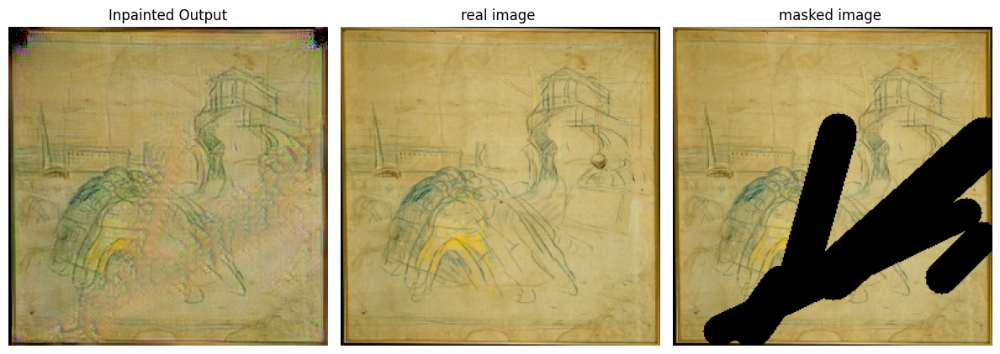

torch.Size([3, 256, 256])


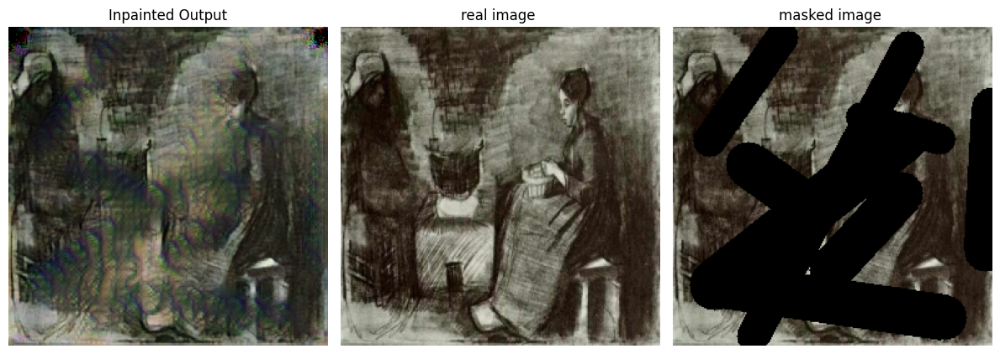

torch.Size([3, 256, 256])


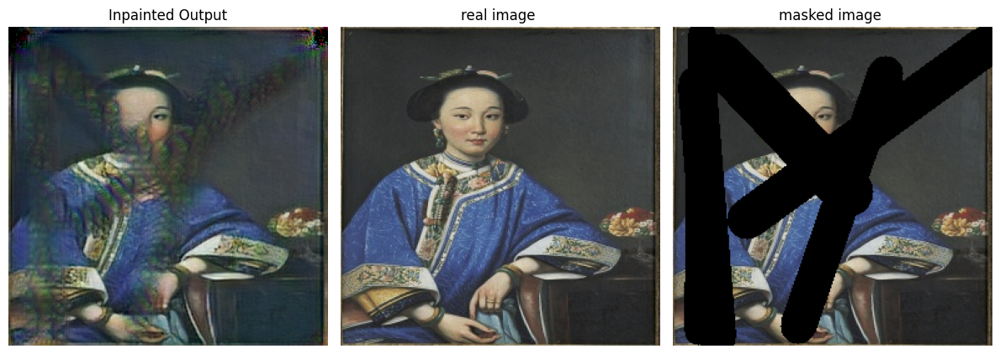

torch.Size([3, 256, 256])


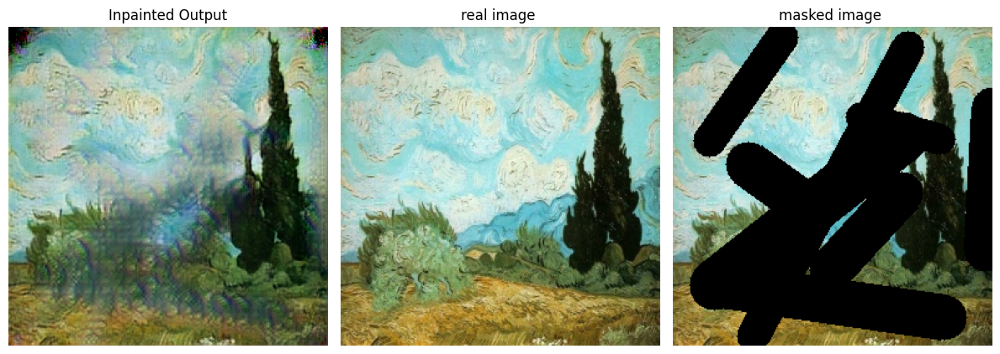

In [ ]:
import matplotlib.pyplot as plt

# Assuming output is a tensor in shape [1, 3, H, W]
for i in range(len(outputs[0])):
    print(outputs[0][i].shape)
    output_image = outputs[0][i].squeeze(0).permute(1, 2, 0).cpu().clamp(0, 1).numpy()
    real_img = real[0][i].squeeze(0).permute(1, 2, 0).cpu().clamp(0, 1).numpy()
    masked_img = masks[0][i].squeeze(0).permute(1, 2, 0).cpu().clamp(0, 1).numpy()
    plt.figure(figsize = (12,12))
    plt.subplot(1,3,1)
    plt.imshow(output_image)
    plt.axis('off')
    plt.title("Inpainted Output")
    plt.subplot(1,3,2)
    plt.imshow(real_img)
    plt.axis('off')
    plt.title("real image ")
    plt.subplot(1,3,3)
    plt.imshow(masked_img)
    plt.axis('off')
    plt.title("masked image ")
    plt.tight_layout()
    plt.show()


# FID and INCEPTION SCORE

In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
from torchvision.models import inception_v3
from torch.nn.functional import adaptive_avg_pool2d
from scipy.linalg import sqrtm
import torch.nn.functional as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ---------- Image Loader ---------- #
def load_images_from_folder(folder, transform, max_images=None):
    images = []
    for i, filename in enumerate(sorted(os.listdir(folder))):
        if filename.lower().endswith(('jpg', 'jpeg', 'png')):
            path = os.path.join(folder, filename)
            image = Image.open(path).convert('RGB')
            images.append(transform(image))
            if max_images and len(images) >= max_images:
                break
    return torch.stack(images)

transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),  # Converts to [0, 1]
])

# ---------- Inception Feature Extractor ---------- #
from torchvision.models.inception import Inception_V3_Weights
from torchvision.models.feature_extraction import create_feature_extractor

def get_inception_features(images, batch_size=4):
    weights = Inception_V3_Weights.DEFAULT
    model = inception_v3(weights=weights, transform_input=False).to(device)
    model.eval()

    # Extract features from 'avgpool' layer
    feature_extractor = create_feature_extractor(model, return_nodes={'avgpool': 'features'}).to(device)

    features = []
    with torch.no_grad():
        for i in range(0, len(images), batch_size):
            batch = images[i:i+batch_size].to(device)
            out = feature_extractor(batch)['features']  # shape: [B, 2048, 1, 1]
            out = out.view(out.size(0), -1)  # Flatten to [B, 2048]
            features.append(out.cpu().numpy())
    return np.concatenate(features, axis=0)


# ---------- FID Calculation ---------- #
def calculate_fid(mu1, sigma1, mu2, sigma2, eps=1e-6):
    covmean = sqrtm(sigma1 @ sigma2)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return np.sum((mu1 - mu2) ** 2) + np.trace(sigma1 + sigma2 - 2 * covmean)

def compute_fid(real_images, fake_images):
    act1 = get_inception_features(real_images)
    act2 = get_inception_features(fake_images)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    return calculate_fid(mu1, sigma1, mu2, sigma2)

# ---------- Inception Score ---------- #
def compute_inception_score(images, splits=10):
    model = inception_v3(pretrained=True, transform_input=False).to(device)
    model.eval()
    preds = []

    with torch.no_grad():
        for i in range(0, len(images), 32):
            batch = images[i:i+32].to(device)
            pred = F.softmax(model(batch), dim=1)
            preds.append(pred.cpu().numpy())

    preds = np.concatenate(preds, axis=0)
    scores = []
    N = preds.shape[0]

    for i in range(splits):
        part = preds[i * (N // splits): (i + 1) * (N // splits), :]
        kl = part * (np.log(part) - np.log(np.expand_dims(part.mean(axis=0), 0)))
        scores.append(np.exp(np.mean(np.sum(kl, axis=1))))

    return np.mean(scores), np.std(scores)

# ---------- Main ---------- #
if __name__ == "__main__":
    real_path = "/kaggle/input/paintings/largewide/largewide/real images"
    fake_path = "/kaggle/input/paintings/largewide/largewide/inpainted images"

    real_images = load_images_from_folder(real_path, transform)
    fake_images = load_images_from_folder(fake_path, transform)

    print(f"Loaded {len(real_images)} real and {len(fake_images)} fake images")

    # Compute FID
    fid_score = compute_fid(real_images, fake_images)
    print(f"FID: {fid_score:.4f}")

    # Compute IS
    inception_mean, inception_std = compute_inception_score(fake_images)
    print(f"Inception Score: {inception_mean:.4f} ± {inception_std:.4f}")


Loaded 100 real and 100 fake images


/usr/local/lib/python3.11/dist-packages/torchvision/models/feature_extraction.py:174: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)
/usr/local/lib/python3.11/dist-packages/torchvision/models/feature_extraction.py:174: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)


FID: 132.4526


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Inception Score: 2.5494 ± 0.3684


In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
from torchvision.models.inception import inception_v3, Inception_V3_Weights
from torchvision.models.feature_extraction import create_feature_extractor
import torch.nn.functional as F
from scipy.linalg import sqrtm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# -------- Load and Split Images Based on Filename -------- #
def load_inpainted_and_real(folder, transform):
    real_images, fake_images = [], []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            path = os.path.join(folder, filename)
            img = Image.open(path).convert('RGB')
            img_tensor = transform(img)
            if "_real" in filename:
                real_images.append(img_tensor)
            elif "_inpainted" in filename:
                fake_images.append(img_tensor)
    return torch.stack(real_images), torch.stack(fake_images)

# -------- Inception Feature Extraction (FID) -------- #
def get_inception_features(images, batch_size=32):
    weights = Inception_V3_Weights.DEFAULT
    model = inception_v3(weights=weights, transform_input=False, aux_logits=True).to(device)
    feature_extractor = create_feature_extractor(model, return_nodes={'avgpool': 'features'}).to(device)
    model.eval()

    features = []
    with torch.no_grad():
        for i in range(0, len(images), batch_size):
            batch = images[i:i+batch_size].to(device)
            out = feature_extractor(batch)['features']  # [B, 2048, 1, 1]
            out = out.view(out.size(0), -1)  # [B, 2048]
            features.append(out.cpu().numpy())
    return np.concatenate(features, axis=0)

# -------- FID Calculation -------- #
def calculate_fid(mu1, sigma1, mu2, sigma2, eps=1e-6):
    covmean = sqrtm(sigma1 @ sigma2)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return np.sum((mu1 - mu2) ** 2) + np.trace(sigma1 + sigma2 - 2 * covmean)

def compute_fid(real_images, fake_images):
    act1 = get_inception_features(real_images)
    act2 = get_inception_features(fake_images)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    return calculate_fid(mu1, sigma1, mu2, sigma2)

# -------- Inception Score Calculation -------- #
def compute_inception_score(images, splits=10):
    weights = Inception_V3_Weights.DEFAULT
    model = inception_v3(weights=weights, transform_input=False, aux_logits=True).to(device)
    model.eval()

    preds = []
    with torch.no_grad():
        for i in range(0, len(images), 32):
            batch = images[i:i+32].to(device)
            pred = F.softmax(model(batch), dim=1)
            preds.append(pred.cpu().numpy())

    preds = np.concatenate(preds, axis=0)
    scores = []
    N = preds.shape[0]
    for i in range(splits):
        part = preds[i * (N // splits):(i + 1) * (N // splits), :]
        kl = part * (np.log(part) - np.log(np.expand_dims(part.mean(axis=0), 0)))
        scores.append(np.exp(np.mean(np.sum(kl, axis=1))))
    return np.mean(scores), np.std(scores)

# -------- Main -------- #
if __name__ == "__main__":
    folder_path = "/kaggle/input/paintings/inpainted_results"

    transform = transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
    ])

    real_images, fake_images = load_inpainted_and_real(folder_path, transform)

    print(f"Loaded {len(real_images)} real and {len(fake_images)} inpainted images.")

    fid_score = compute_fid(real_images, fake_images)
    print(f"FID: {fid_score:.4f}")

    is_mean, is_std = compute_inception_score(fake_images)
    print(f"Inception Score: {is_mean:.4f} ± {is_std:.4f}")


Loaded 100 real and 100 inpainted images.


/usr/local/lib/python3.11/dist-packages/torchvision/models/feature_extraction.py:174: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)
/usr/local/lib/python3.11/dist-packages/torchvision/models/feature_extraction.py:174: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)


FID: 100.2797
Inception Score: 2.8176 ± 0.5548


In [ ]:
if __name__ == "__main__":
    folder_path = "/kaggle/input/paintings/deepfillv2_inpainted_results"

    transform = transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
    ])

    real_images, fake_images = load_inpainted_and_real(folder_path, transform)

    print(f"Loaded {len(real_images)} real and {len(fake_images)} inpainted images.")

    fid_score = compute_fid(real_images, fake_images)
    print(f"FID: {fid_score:.4f}")

    is_mean, is_std = compute_inception_score(fake_images)
    print(f"Inception Score: {is_mean:.4f} ± {is_std:.4f}")

Loaded 100 real and 100 inpainted images.


/usr/local/lib/python3.11/dist-packages/torchvision/models/feature_extraction.py:174: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)
/usr/local/lib/python3.11/dist-packages/torchvision/models/feature_extraction.py:174: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)


FID: 126.9597
Inception Score: 2.3924 ± 0.2641
